In [3]:
import pandas as pd
df = pd.read_csv('sampled_data.csv')

In [4]:
import os
import io
import cv2
import tarfile
import numpy as np
os.environ['OPENCV_IO_ENABLE_OPENEXR'] = '1'

def load_depth_from_tar(file_data, is_float16=True):
    file_array = np.frombuffer(file_data, dtype=np.uint8)
    image = cv2.imdecode(file_array, cv2.IMREAD_ANYCOLOR | cv2.IMREAD_ANYDEPTH)
    if is_float16:
        invalid_mask = (image == 65504)  # Detect invalid depth values for float16
    else:
        invalid_mask = None
    image = image / 10000  # Convert depth values from cm to meters
    return image, invalid_mask

def load_depth(depth_path, is_float16=True):
    image = cv2.imread(depth_path, cv2.IMREAD_ANYCOLOR | cv2.IMREAD_ANYDEPTH)[...,0] #(H, W)
    if is_float16==True:
        invalid_mask=(image==65504)
    else:
        invalid_mask=None
    image = image / 10000 # cm -> 100m
    return image, invalid_mask


def convert_tar_path(input_path):
    directory, file_name = os.path.split(input_path)
    return directory.replace("big_city", "big_city_depth")

def convert_tar_path_to_sampled(input_path):
    directory, file_name = os.path.split(input_path)
    return directory.replace("big_city", "sampled_big_city")

def convert_image_path(input_path):
    directory, file_name = os.path.split(input_path)
    new_directory = directory + "_depth"
    base_name, ext = os.path.splitext(file_name)
    new_file_name = f"{base_name}.exr" if ext == ".png" else file_name
    file_path = os.path.join(new_directory, new_file_name)
    if "./" in file_path:
        file_path = file_path.replace("./", "")
    return file_path

# # Example Inputs
# path1 = "/mnt/51eb0667-f71d-4fe0-a83e-beaff24c04fb/om/depth_estimation_experiments/DiT/depth_datasets/MatrixCity/MatrixCity/big_city/street/test/left_area_test.tar"
# path2 = "/mnt/51eb0667-f71d-4fe0-a83e-beaff24c04fb/om/depth_estimation_experiments/DiT/depth_datasets/MatrixCity/MatrixCity/big_city_depth/street/train/bottom_area.tar"

# # Outputs
# print(convert_tar_path(path1))
# print(convert_tar_path(path2))

# # Example Inputs
# path1 = "./left_area_test/4061.png"
# path2 = "bottom_area_test/0000.png"

# # Outputs
# print(convert_image_path(path1))
# print(convert_image_path(path2))



In [4]:
import os
import torch
import torch.nn as nn
from urllib.request import urlretrieve
import open_clip
from PIL import Image

class AestheticScorer:
    def __init__(self, ckpt_path="data/ckpt", device=None):
        self.ckpt_path = ckpt_path
        os.makedirs(self.ckpt_path, exist_ok=True)
        
        self.aesthetic_model_url = (
            "https://github.com/LAION-AI/aesthetic-predictor/blob/main/sa_0_4_vit_l_14_linear.pth?raw=true"
        )
        self.aesthetic_model_ckpt_path = os.path.join(self.ckpt_path, "sa_0_4_vit_l_14_linear.pth")
        
        self.device = device if device else ("cuda" if torch.cuda.is_available() else "cpu")
        
        self._download_aesthetic_model()
        self._load_models()
        
    def _download_aesthetic_model(self):
        if not os.path.exists(self.aesthetic_model_ckpt_path):
            print("Downloading aesthetic model...")
            urlretrieve(self.aesthetic_model_url, self.aesthetic_model_ckpt_path)
            print(f"Aesthetic model downloaded to {self.aesthetic_model_ckpt_path}")
        else:
            print("Aesthetic model already exists. Skipping download.")
    
    def _load_models(self):
        # Define the aesthetic predictor model architecture
        class AestheticPredictor(nn.Module):
            def __init__(self):
                super().__init__()
                self.linear = nn.Linear(768, 1)  # CLIP ViT-L/14 outputs 768 features

            def forward(self, x):
                return self.linear(x)
        
        # Initialize and load the aesthetic predictor
        self.aesthetic_model = nn.Linear(768, 1)
        checkpoint = torch.load(self.aesthetic_model_ckpt_path, map_location=self.device)
        self.aesthetic_model.load_state_dict(checkpoint)
        self.aesthetic_model = self.aesthetic_model.to(self.device)
        self.aesthetic_model.eval()
        
        # Load the CLIP model and preprocessor
        self.clip_model, _, self.clip_preprocess = open_clip.create_model_and_transforms(
            "ViT-L-14", pretrained="openai"
        )
        self.clip_model = self.clip_model.to(self.device)
        self.clip_model.eval()
        
        print("Models loaded successfully.")
    
    def score_image(self, image_path):
        # Load and preprocess the image
        image = Image.open(image_path).convert("RGB")
        image_input = self.clip_preprocess(image).unsqueeze(0).to(self.device)
        
        # Extract CLIP features
        with torch.no_grad():
            image_features = self.clip_model.encode_image(image_input)
            image_features /= image_features.norm(dim=-1, keepdim=True)
        
        # Predict the aesthetic score
        with torch.no_grad():
            aesthetic_score = self.aesthetic_model(image_features).item()
        
        return aesthetic_score


In [25]:
def count_main_colors_predefined(image):
    """
    Counts the number of main spectral colors in an image by mapping pixels to predefined spectral colors.

    Parameters:
    - image_path: str, path to the image file.

    Returns:
    - num_colors: int, the number of main colors detected.
    - colors: list of tuples, the RGB values of the main colors.
    """
    # Define main spectral colors (you can adjust these values)
    spectral_colors = np.array([
        [255, 0, 0],     # Red
        [255, 127, 0],   # Orange
        [255, 255, 0],   # Yellow
        [0, 255, 0],     # Green
        [0, 0, 255],     # Blue
        [75, 0, 130],    # Indigo
        [148, 0, 211],   # Violet
    ])
    
    # Load image and convert to RGB
    # image = cv2.imread(image_path)
    if image is None:
        raise ValueError("Image not found or cannot be opened.")
    # image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    
    # Reshape image to a 2D array of pixels
    pixels = image.reshape(-1, 3)
    print(pixels.shape)
    # Calculate distances to spectral colors
    distances = np.linalg.norm(pixels[:, None] - spectral_colors[None, :], axis=2)
    
    # Assign each pixel to the closest spectral color
    closest_colors = np.argmin(distances, axis=1)
    
    # Count occurrences of each spectral color
    counts = np.bincount(closest_colors, minlength=len(spectral_colors))
    
    # Determine which spectral colors are present
    present = counts > 0
    num_colors = np.sum(present)
    main_colors = spectral_colors[present]
    
    return int(num_colors), [tuple(color) for color in main_colors.astype(int)]


Mean Depth: 0.9599529504776001
Median Depth: 0.1551000028848648
Variance Depth: 3.789937734603882
6.5504 0.03355
1.0 0.0
Count of histogram elements with value more than 4000: 5
Variance of histogram: 54423052791.6


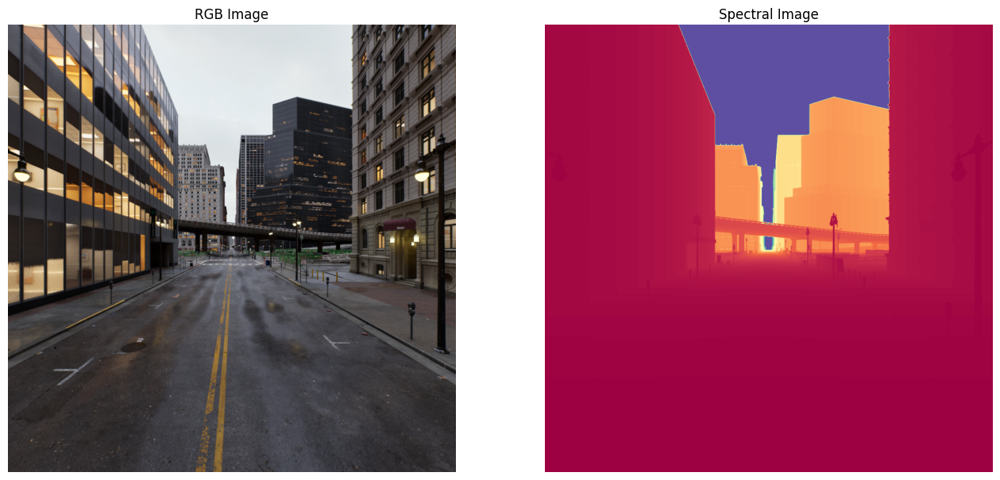

Mean Depth: 3.2696969509124756
Median Depth: 1.2288000583648682
Variance Depth: 10.071843147277832
6.5504 0.03295
1.0 0.0
Count of histogram elements with value more than 4000: 4
Variance of histogram: 34787514330.8


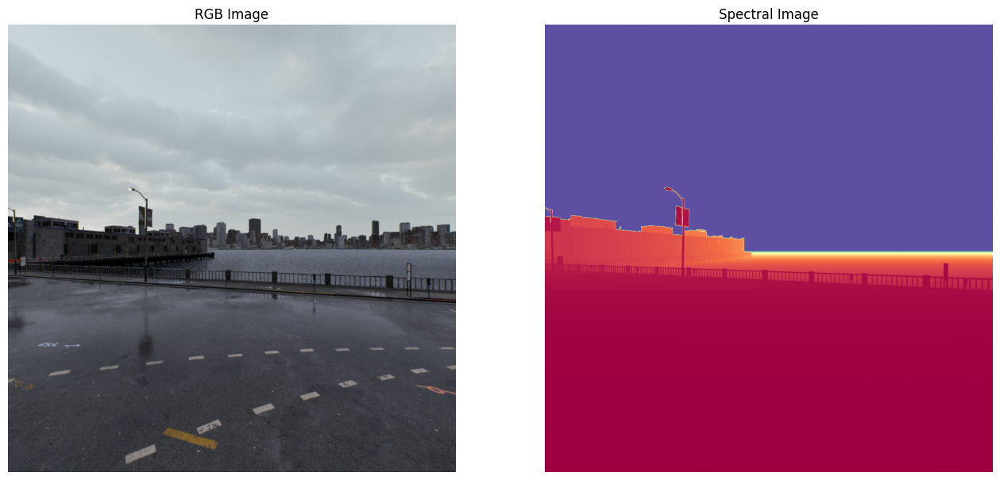

Mean Depth: 0.5683051943778992
Median Depth: 0.13500000536441803
Variance Depth: 2.336343765258789
6.5504 0.033625
1.0 0.0
Count of histogram elements with value more than 4000: 3
Variance of histogram: 73592375733.2


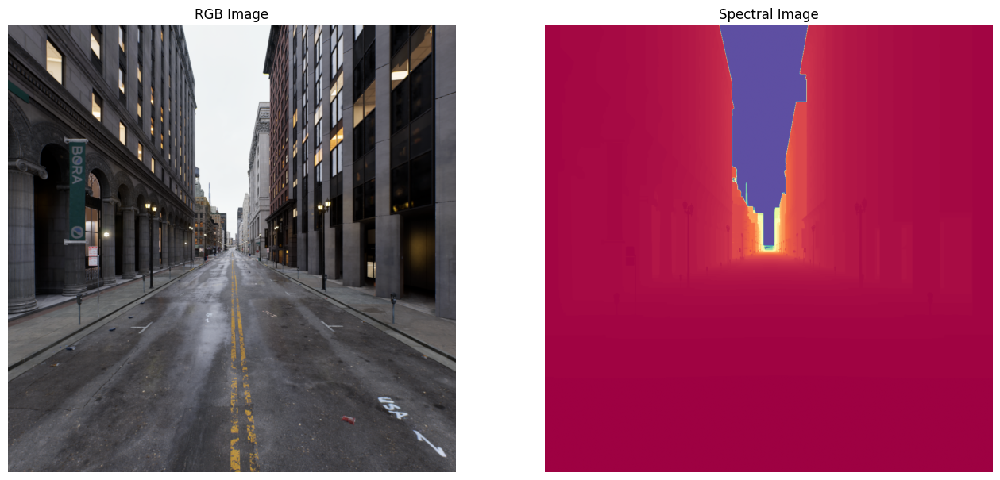

Mean Depth: 2.0145528316497803
Median Depth: 0.1054999977350235
Variance Depth: 8.535325050354004
6.5504 0.034125
1.0 0.0
Count of histogram elements with value more than 4000: 3
Variance of histogram: 46290276665.8


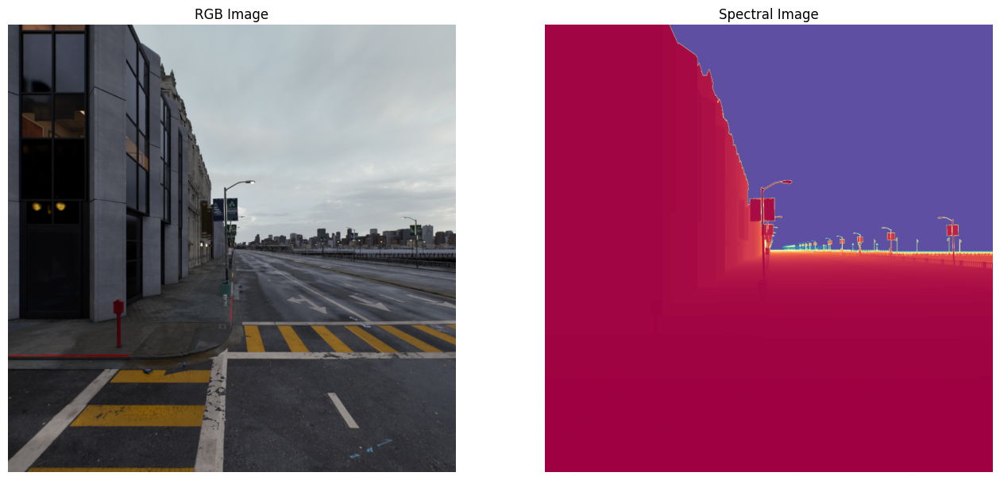

Mean Depth: 0.13290908932685852
Median Depth: 0.11680000275373459
Variance Depth: 0.02969973161816597
2.1328 0.08085
1.0 0.0
Count of histogram elements with value more than 4000: 2
Variance of histogram: 380352162726.4


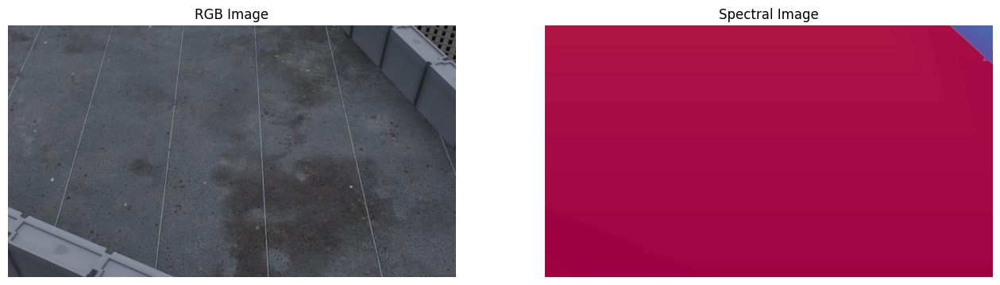

Mean Depth: 0.7949228882789612
Median Depth: 0.14730000495910645
Variance Depth: 2.8041789531707764
6.5504 0.0336
1.0 0.0
Count of histogram elements with value more than 4000: 4
Variance of histogram: 43013676968.8


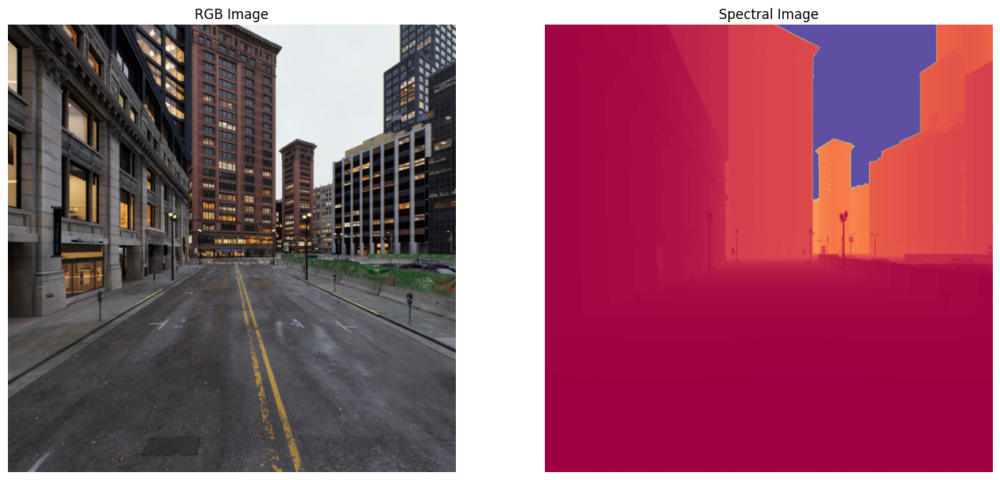

Mean Depth: 0.9694209098815918
Median Depth: 0.12999999523162842
Variance Depth: 4.555692195892334
6.5504 0.033525
1.0 0.0
Count of histogram elements with value more than 4000: 3
Variance of histogram: 65277555548.8


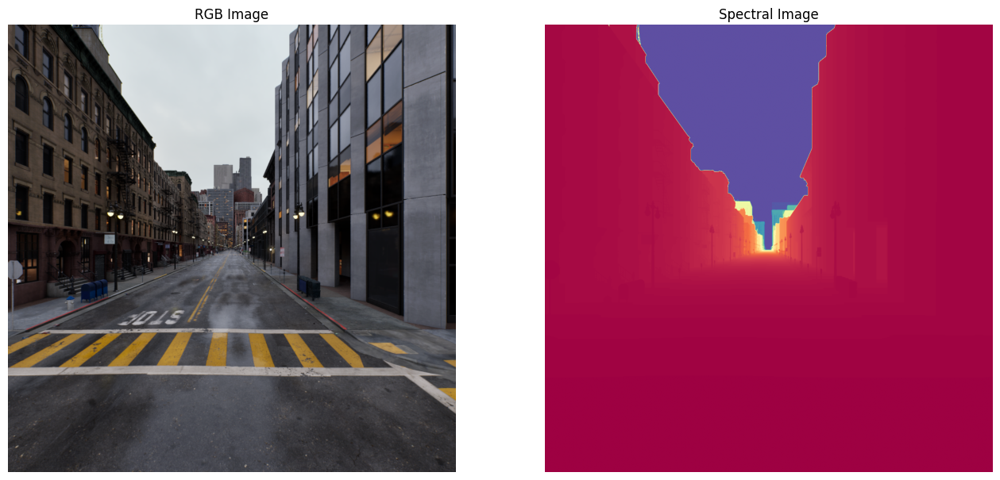

Mean Depth: 1.480276346206665
Median Depth: 0.3774000108242035
Variance Depth: 5.194846153259277
6.5504 0.1311
1.0 0.0
Count of histogram elements with value more than 4000: 6
Variance of histogram: 42762351749.2


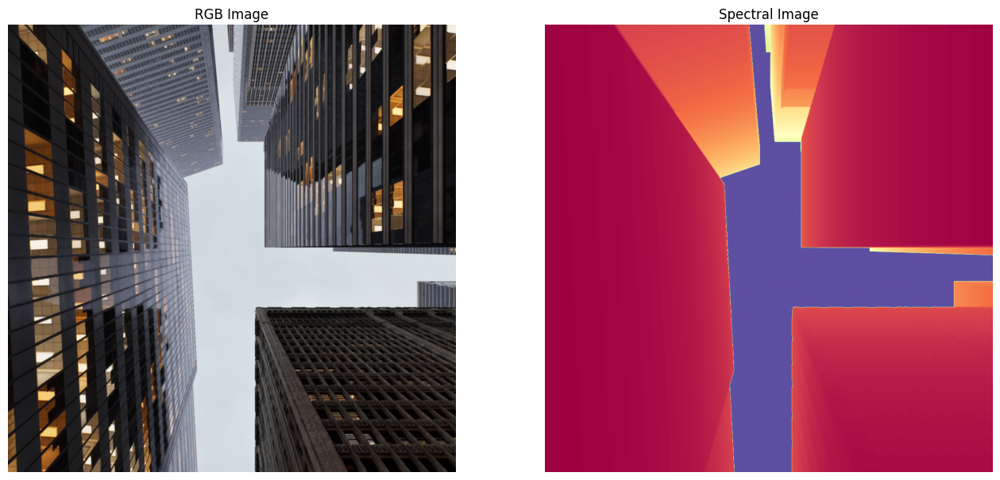

Mean Depth: 0.7369372844696045
Median Depth: 0.13089999556541443
Variance Depth: 3.2076518535614014
6.5504 0.0336
1.0 0.0
Count of histogram elements with value more than 4000: 5
Variance of histogram: 68316025258.2


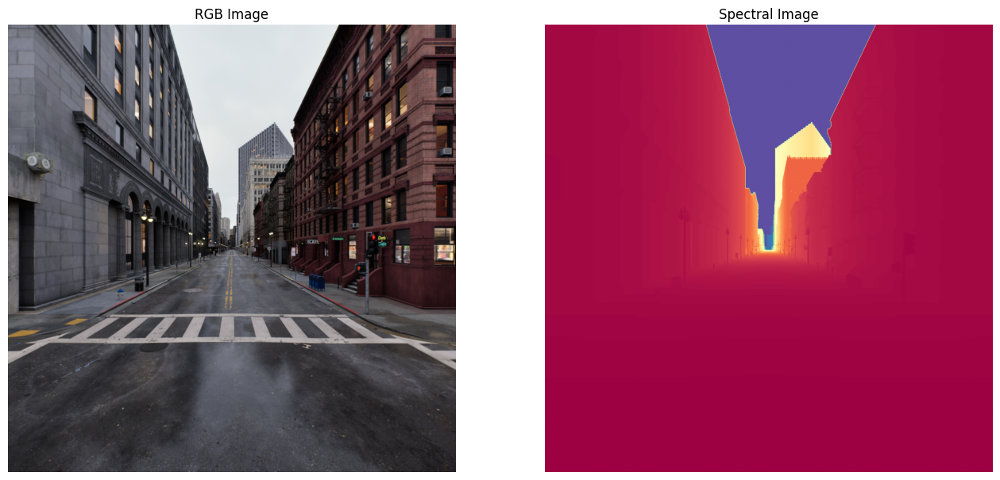

Mean Depth: 0.8053810000419617
Median Depth: 0.17299999296665192
Variance Depth: 3.380187511444092
6.5504 0.03345
1.0 0.0
Count of histogram elements with value more than 4000: 4
Variance of histogram: 65545656992.8


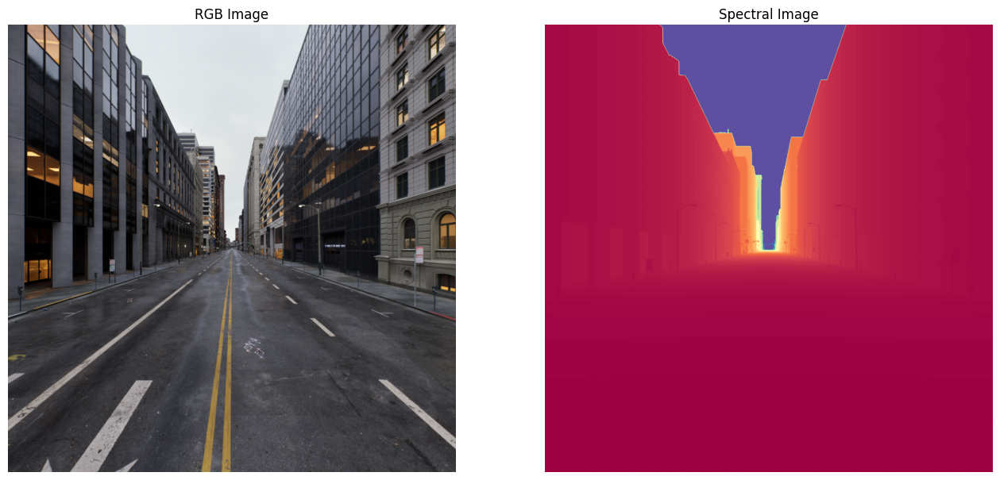

Mean Depth: 0.20932640135288239
Median Depth: 0.07005000114440918
Variance Depth: 0.5513088703155518
6.5504 0.03355
1.0 0.0
Count of histogram elements with value more than 4000: 3
Variance of histogram: 83667195263.0


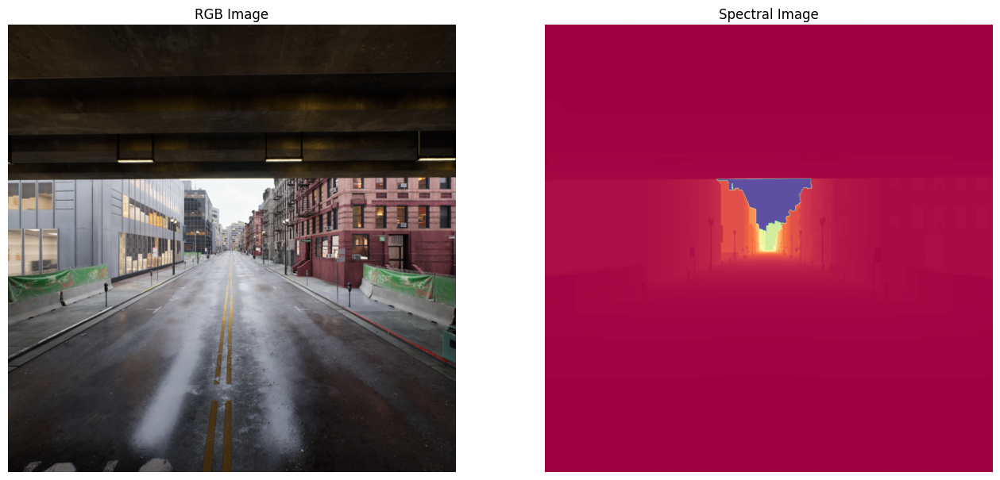

Mean Depth: 0.8032923936843872
Median Depth: 0.21040000021457672
Variance Depth: 2.852890729904175
6.5504 0.03335
1.0 0.0
Count of histogram elements with value more than 4000: 5
Variance of histogram: 54941925266.6


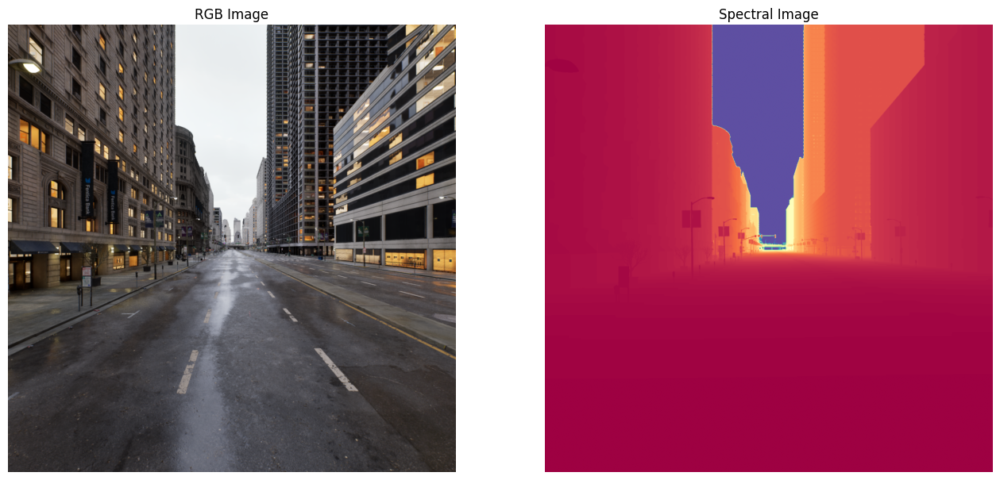

Mean Depth: 0.619246244430542
Median Depth: 0.17569999396800995
Variance Depth: 2.3202621936798096
6.5504 0.033275
1.0 0.0
Count of histogram elements with value more than 4000: 4
Variance of histogram: 63951301886.2


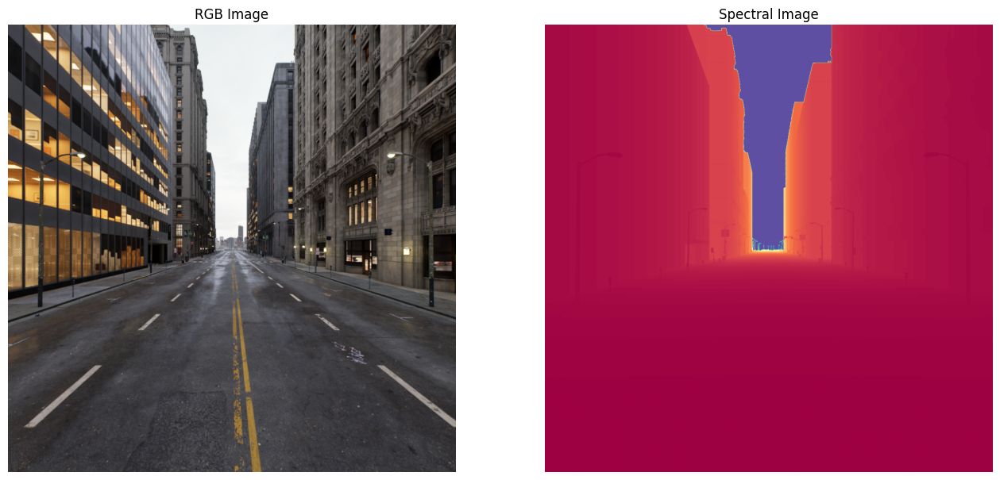

Mean Depth: 0.4187627136707306
Median Depth: 0.21559999883174896
Variance Depth: 1.3103634119033813
6.5504 0.033175
1.0 0.0
Count of histogram elements with value more than 4000: 3
Variance of histogram: 80645307900.6


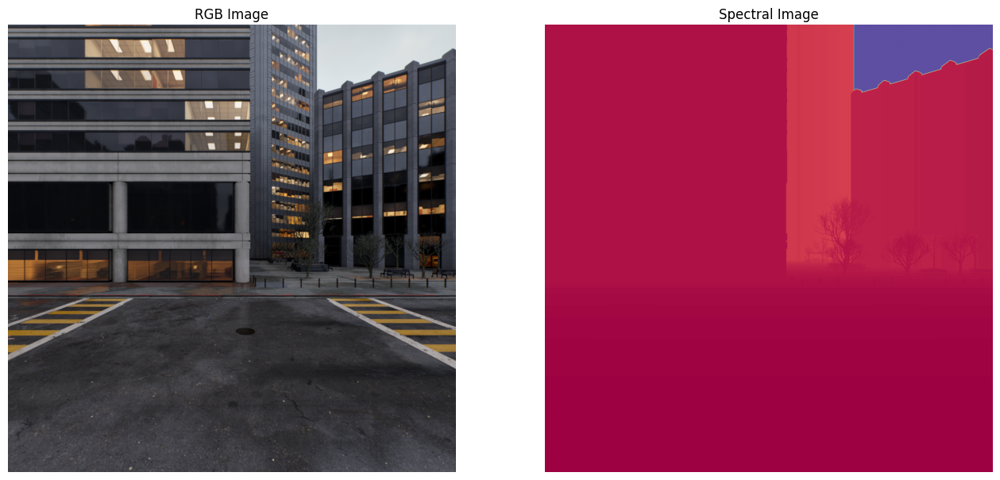

Mean Depth: 0.10803879052400589
Median Depth: 0.13339999318122864
Variance Depth: 0.0015904197935014963
0.5952 0.034275
1.0 0.0
Count of histogram elements with value more than 4000: 3
Variance of histogram: 44304287333.8


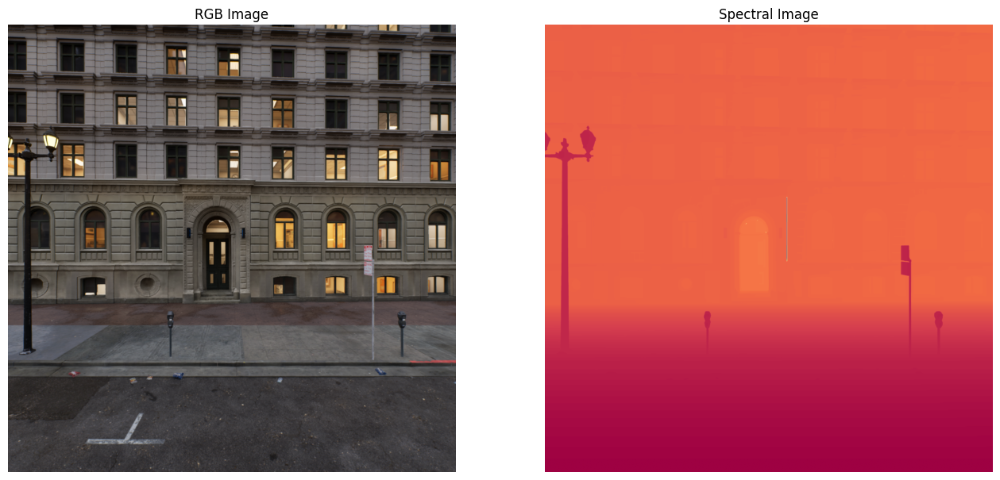

Mean Depth: 1.9739761352539062
Median Depth: 0.30059999227523804
Variance Depth: 7.803912162780762
6.5504 0.1412
1.0 0.0
Count of histogram elements with value more than 4000: 2
Variance of histogram: 50054360250.4


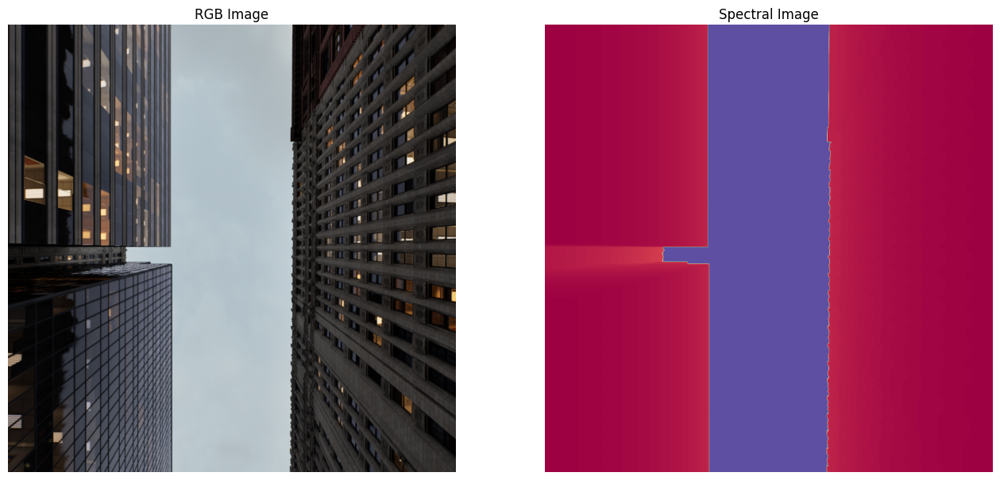

Mean Depth: 0.6103399991989136
Median Depth: 0.2563999891281128
Variance Depth: 1.0949665307998657
6.5504 0.03425
1.0 0.0
Count of histogram elements with value more than 4000: 4
Variance of histogram: 42410860071.4


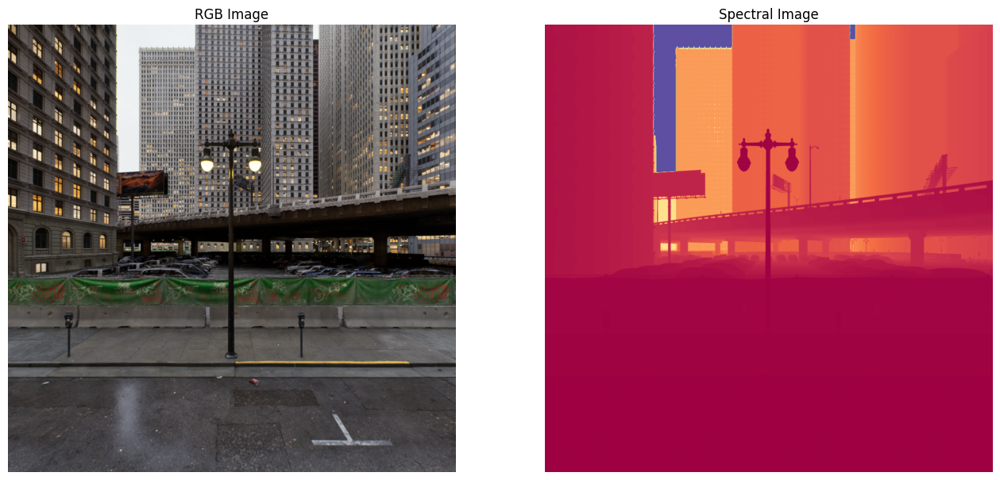

Mean Depth: 0.4627501368522644
Median Depth: 0.2037000060081482
Variance Depth: 1.067581057548523
6.5504 0.03345
1.0 0.0
Count of histogram elements with value more than 4000: 6
Variance of histogram: 68402246512.0


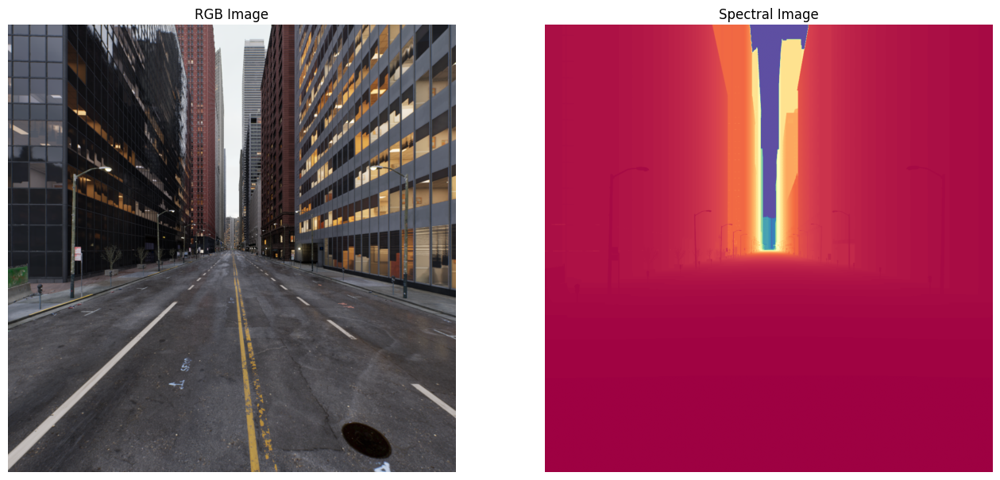

Mean Depth: 2.6375296115875244
Median Depth: 0.33480000495910645
Variance Depth: 9.527514457702637
6.5504 0.0331
1.0 0.0
Count of histogram elements with value more than 4000: 4
Variance of histogram: 39143056121.4


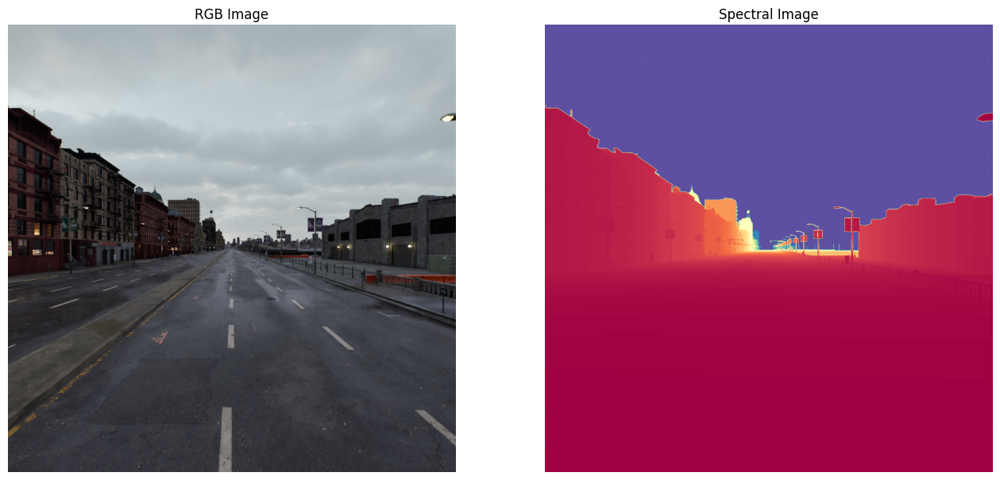

Mean Depth: 1.6254453659057617
Median Depth: 0.23280000686645508
Variance Depth: 7.169829845428467
6.5504 0.0335
1.0 0.0
Count of histogram elements with value more than 4000: 2
Variance of histogram: 53243536332.8


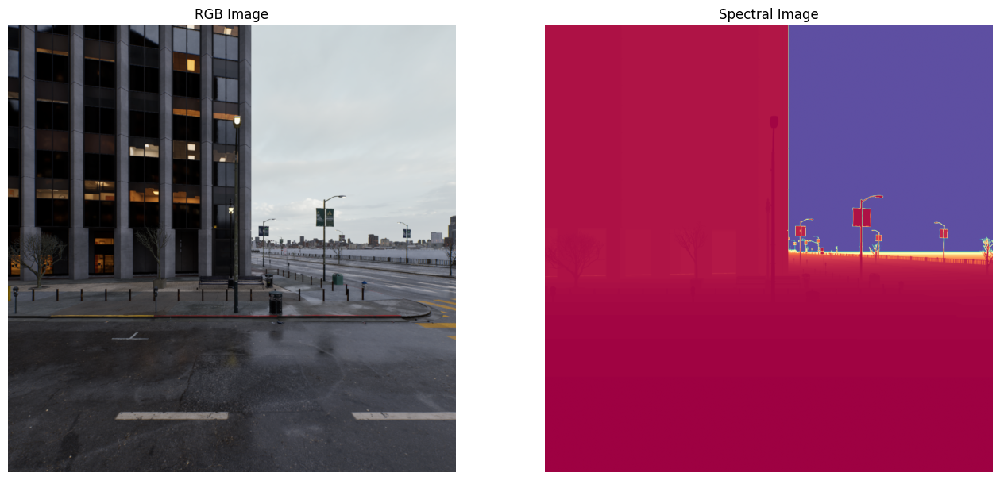

In [35]:
i = 1
import matplotlib.pyplot as plt
import numpy as np
import matplotlib.cm as cm
import time
# aesthetic_scorer = AestheticScorer()

for i in range(20):
    file_path = os.path.join(convert_tar_path(df.loc[i]["Tar File"]), convert_image_path(df.loc[i]["File Path Inside Tar"]))
    rgb_file_path = os.path.join(convert_tar_path_to_sampled(df.loc[i]["Tar File"]), df.loc[i, "File Path Inside Tar"].lstrip("./"))
    
    
    depth_image, invalid_mask =  load_depth(file_path)
    depth_image_real = depth_image.copy()
    # aesthetic_score = aesthetic_scorer.score_image(rgb_file_path)

    rgb_image = plt.imread(rgb_file_path)

    mean_depth = np.mean(depth_image)
    median_depth = np.median(depth_image)
    variance_depth = np.var(depth_image)

    print(f"Mean Depth: {mean_depth}")
    print(f"Median Depth: {median_depth}")
    print(f"Variance Depth: {variance_depth}")
    # print(f"Aesthetic score: {aesthetic_score}")
    print(depth_image_real.max(), depth_image_real.min())
    # break
    depth_image_norm = (depth_image - depth_image.min()) / (depth_image.max() - depth_image.min())
    print(depth_image_norm.max(), depth_image_norm.min())

    # Colorize depth maps using the logic from colorize_depth_maps
    cmap = cm.Spectral
    depth_image_clipped = np.clip(depth_image_norm, 0, 1)
    # Convert depth_image_clipped to grayscale
    spectral_image = cmap(depth_image_clipped)[:, :, :3]  # Remove alpha channel

    rgb_image = plt.imread(rgb_file_path)
    histogram, bin_edges = np.histogram(depth_image_clipped, bins=10, range=(0, 1))
    count_above_4000 = sum(1 for value in histogram if value > 4000)
    count_above_1000 = sum(1 for value in histogram if value > 1000)
    variance_histogram = np.var(histogram)
    
    print(f"Count of histogram elements with value more than 4000: {count_above_4000}")
    print(f"Variance of histogram: {variance_histogram}")
    
    plt.figure(figsize=(16, 8))  # Make the image bigger

    plt.subplot(1, 2, 1)
    plt.imshow(rgb_image)
    plt.title("RGB Image")
    plt.axis('off')  # Hide axes for better visualization

    plt.subplot(1, 2, 2)
    plt.imshow(spectral_image)
    plt.title("Spectral Image")
    plt.axis('off')  # Hide axes for better visualization

    plt.show()
    time.sleep(2)

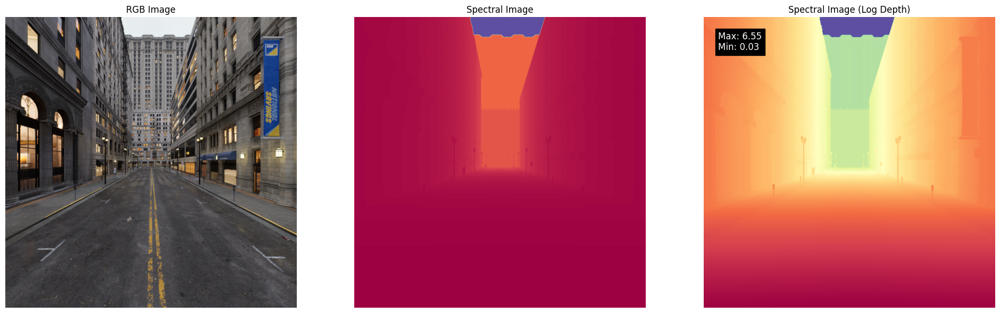

KeyboardInterrupt: 

In [22]:
import os
import matplotlib.pyplot as plt
import numpy as np
import matplotlib.cm as cm
import time
from IPython.display import clear_output

# Use inline plotting
%matplotlib inline

for i in range(101000):
    # Process file paths
    file_path = os.path.join(convert_tar_path(df.loc[i]["Tar File"]), convert_image_path(df.loc[i]["File Path Inside Tar"]))
    rgb_file_path = os.path.join(convert_tar_path_to_sampled(df.loc[i]["Tar File"]), df.loc[i, "File Path Inside Tar"].lstrip("./"))
    depth_image, invalid_mask = load_depth(file_path)
    depth_image_real = depth_image.copy()

    # Logarithmic depth values
    depth_image_log = np.log(depth_image)
    depth_image_new = (depth_image - depth_image.min()) / (depth_image.max() - depth_image.min())
    cmap = cmap = cm.Spectral
    depth_image_clipped = np.clip(depth_image_new, 0, 1)
    spectral_image = cmap(depth_image_clipped)[:, :, :3]  # Remove alpha channel

    # Depth values
    depth_image_new_log = (depth_image_log - depth_image_log.min()) / (depth_image_log.max() - depth_image_log.min())
    cmap = cm.Spectral
    depth_image_clipped_log = np.clip(depth_image_new_log, 0, 1)
    spectral_image_log = cmap(depth_image_clipped_log)[:, :, :3]  # Remove alpha channel

    rgb_image = plt.imread(rgb_file_path)

    # Clear the previous output
    clear_output(wait=True)

    # Create a new figure
    plt.figure(figsize=(24, 8))

    # Plot the RGB image
    plt.subplot(1, 3, 1)
    plt.imshow(rgb_image)
    plt.title("RGB Image")
    plt.axis('off')  # Hide axes for better visualization

    # Plot the spectral image
    plt.subplot(1, 3, 2)
    plt.imshow(spectral_image)
    plt.title("Spectral Image")
    plt.axis('off')  # Hide axes for better visualization

    # Plot the spectral image with logarithmic depth
    plt.subplot(1, 3, 3)
    plt.imshow(spectral_image_log)
    plt.title("Spectral Image (Log Depth)")
    plt.axis('off')  # Hide axes for better visualization

    # Add max and min values as text
    max_value = depth_image_real.max()
    min_value = depth_image_real.min()
    plt.text(
        0.05, 0.95, 
        f"Max: {max_value:.2f}\nMin: {min_value:.2f}", 
        color='white', fontsize=12, backgroundcolor='black', 
        verticalalignment='top', horizontalalignment='left', 
        transform=plt.gca().transAxes
    )
    # Save the plots for future reviews
    dir_to_save = "big_city_log_depth_visuals"
    output_path = rgb_file_path.replace("big_city", dir_to_save)
    output_dir = os.path.dirname(output_path)
    os.makedirs(output_dir, exist_ok=True)

    # Save the combined figure
    plt.savefig(output_path, bbox_inches='tight', pad_inches=0.1)
    
    # Show the plot
    plt.show()
    # Optional: Add a short pause to control update speed
    # time.sleep(2)

    # Close the plot to destroy the figure
    plt.close()

In [18]:
output_dir

'/mnt/51eb0667-f71d-4fe0-a83e-beaff24c04fb/om/depth_estimation_experiments/DiT/depth_datasets/MatrixCity/MatrixCity/sampled_big_city_log_depth_visuals/street/train/right_area'

In [74]:
depth_image_clipped.shape

(1000, 1000)

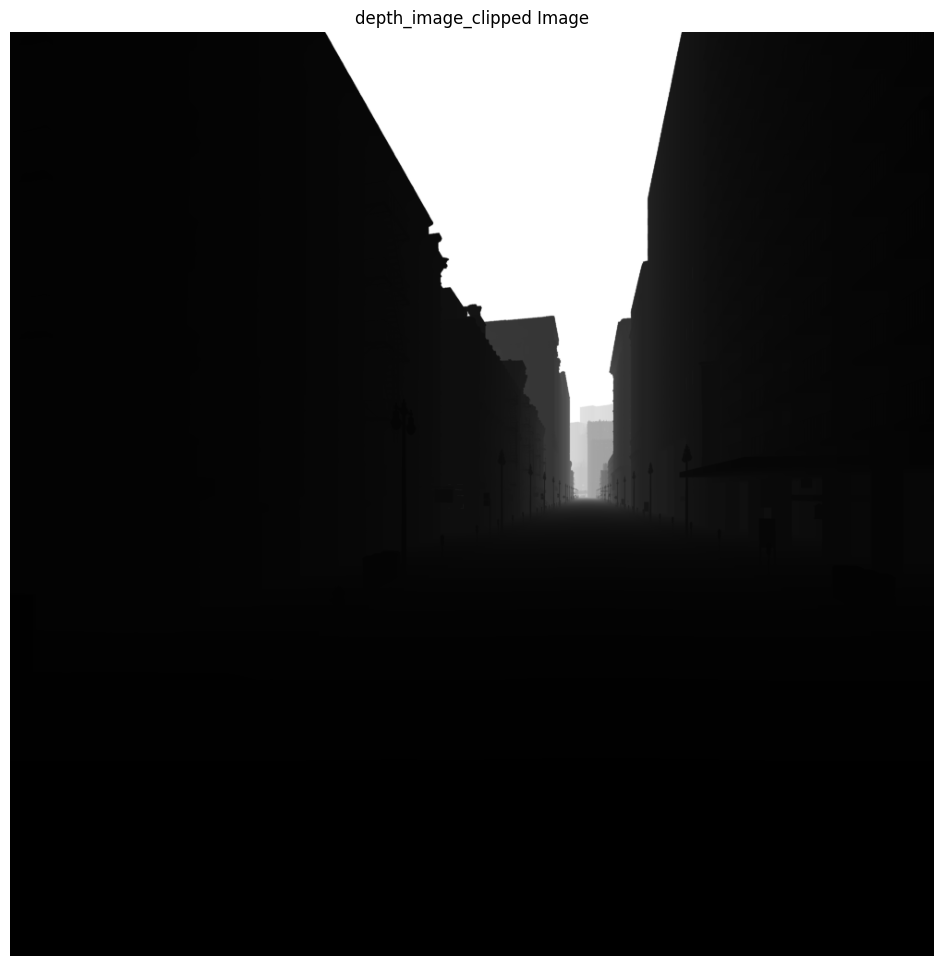

In [53]:
depth_image_clipped.shape
plt.figure(figsize=(12, 12)) 
plt.imshow(depth_image_clipped)
plt.title("depth_image_clipped Image")
plt.axis('off')  # Hide axes for better visualization
plt.show()


(1000, 1000)

In [3]:
import pandas as pd

# Read the CSV file
csv_file_path = "/mnt/51eb0667-f71d-4fe0-a83e-beaff24c04fb/om/depth_estimation_experiments/DiT/process_data/Matrixcity/featured_sampled_data.csv"
df = pd.read_csv(csv_file_path)

# Show the head of the dataframe
# df.head()


In [47]:
# Notes 
df.columns

Index(['Tar File', 'File Path Inside Tar', 'Location Type', 'Data Type',
       'Base File', 'Tar ID', 'Mean Depth', 'Median Depth', 'Variance Depth',
       'Aesthetic Score', 'Max Depth', 'Min Depth', 'Above 1000', 'Above 4000',
       'Variance in Histogram'],
      dtype='object')

In [22]:
df[df["Location Type"]=="aerial"]["Mean Depth"].nlargest(2)

100120    6.525508
100734    6.525508
Name: Mean Depth, dtype: float64

Notes

Filters Interesting Images


Filters for Unwanted Images
```
df[df["Mean Depth"] < 0.05]  # Mostly the ceiling and plain images
df[(df["Mean Depth"] > 5.0)&(df["Location Type"] == "street")] # Lower values for street, mainly plain skies
df[(df["Mean Depth"] < 1)&(df["Location Type"] == "aerial")] # One sample
```

In [24]:
import random
import matplotlib.pyplot as plt
import numpy as np
import matplotlib.cm as cm


# Randomly select 5 rows from the dataframe
new_df = df[(df["Mean Depth"] > 6)&(df["Location Type"] == "aerial")]
print(f'Total dataset {len(new_df)}')

random_rows = new_df.sample(n=10)
random.seed(120)

for _, row in random_rows.iterrows():
    file_path = os.path.join(convert_tar_path(row["Tar File"]), convert_image_path(row["File Path Inside Tar"]))
    rgb_file_path = os.path.join(convert_tar_path_to_sampled(row["Tar File"]), row["File Path Inside Tar"].lstrip("./"))
    depth_image, invalid_mask = load_depth(file_path)
    depth_image_real = depth_image.copy()
    
    # depth_image = np.log(depth_image)
    # Logarithmic depth values
    depth_image_new = (depth_image - depth_image.min()) / (depth_image.max() - depth_image.min())

    cmap = cm.Spectral
    depth_image_clipped = np.clip(depth_image_new, 0, 1)
    # Convert depth_image_clipped to grayscale
    spectral_image = cmap(depth_image_clipped)[:, :, :3]  # Remove alpha channel

    rgb_image = plt.imread(rgb_file_path)
    print(f"File Path: {file_path}")
    print(f"RGB File Path: {rgb_file_path}")
    print(f"Mean Depth: {row['Mean Depth']}")
    print(f"Median Depth: {row['Median Depth']}")
    print(f"Variance Depth: {row['Variance Depth']}")
    print(f"Aesthetic Score: {row['Aesthetic Score']}")
    print(f"Max Depth: {row['Max Depth']}")
    print(f"Min Depth: {row['Min Depth']}")
    print(f"Above 1000: {row['Above 1000']}")
    print(f"Above 4000: {row['Above 4000']}")
    print(f"Variance in Histogram: {row['Variance in Histogram']}")
    
    plt.figure(figsize=(8, 5))  # Make the image bigger and add extra area on top

    # Add an extra area on top for the file path
    # plt.suptitle(f"File Path: {rgb_file_path}", fontsize=12, y=0.95)
    # plt.suptitle(f"Mean Depth: {row['Mean Depth']}", fontsize=12, y=0.95)

    plt.subplot(1, 2, 1)
    plt.imshow(rgb_image)
    plt.title("RGB Image")
    plt.axis('off')  # Hide axes for better visualization

    plt.subplot(1, 2, 2)
    plt.imshow(spectral_image)
    plt.title(f"Mean Depth: {row['Mean Depth']}")
    plt.axis('off')  # Hide axes for better visualization
    plt.show()


SyntaxError: invalid syntax (1713922298.py, line 55)

KeyboardInterrupt: 